In [93]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import RobustScaler
from matplotlib import rc
import matplotlib.pyplot as plt
from pylab import rcParams
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

sns.set(style="whitegrid", palette='muted', font_scale=1.5)
rcParams['figure.figsize']= 10, 5

# Final Project - Data 623 
## Covid 19 Case & Death Cumlative Number Impact by Vaccine Deployment

## How has the Vaccine Rollout impacted the Incidence Rates of Covid 19 in Canada?

## Methodology

To explore the association with the cummulative rate of Covid cases in Canada, a visual analysis will be used to look at rate of Covid 19 over time in each 10 selected Canadian Provinces. The rate of increase can be estimated by the slope of the cummulative increase in overall covid number. 

    Total number of cases (per day) are first normalized by country population

    Cases and death cummlative totals per 100,00 people in province were visualized using plotly
    
    Vaccine Phase variable was engineered into the data base on public sources of estimated vaccine rollout stages. 

    Cummlative case and death numbers were visualized against the determined vaccine phases using seaborn package 

    Extra: Global Timelapse of early cummulation for Covid 19 Cases


In [74]:
# File Path from GitHub - John Hopkins Covid Data
file_path_cases= 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
file_path_deaths = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
#read csv file
covid_raw_cases = pd.read_csv(file_path_cases, error_bad_lines=False)
covid_raw_deaths = pd.read_csv(file_path_deaths, error_bad_lines=False)

# Cases Data

In [75]:
#Retrive only Canadian Data
cases = covid_raw_cases.loc[covid_raw_cases['Country/Region']== "Canada"]
cases = cases.drop(['Country/Region', 'Lat', 'Long'], axis=1)
cases.head()

,Province/State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,4/10/21,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21
39,Alberta,0,0,0,0,0,0,0,0,0,...,159719,160902,162038,163119,164531,166177,167793,169279,170795,172186
40,British Columbia,0,0,0,0,0,0,1,1,1,...,109540,109540,112829,113702,114870,116075,117080,117080,117080,120040
41,Diamond Princess,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
42,Grand Princess,0,0,0,0,0,0,0,0,0,...,13,13,13,13,13,13,13,13,13,13
43,Manitoba,0,0,0,0,0,0,0,0,0,...,35104,35213,35327,35459,35539,35688,35815,35992,36159,36267


To normalize the covid data based on the province populations, a seperate csv file was created with the population number taken from Statistics Canada. Numbers refeclt the populations for January 1, 2021.

In [76]:
province_poputions = pd.read_csv("Province Population.csv")
province_poputions

,Province/State,Population
0,Alberta,4436258
1,British Columbia,5153039
2,Saskatchewan,1178832
3,Manitoba,1380935
4,Ontario,14755211
5,Quebec,8575944
6,Newfoundland and Labrador,520438
7,Nova Scotia,979449
8,Prince Edward Island,159819
9,New Brunswick,782078


In [77]:
#Strip white spaces from provinces names
cases['Province/State'] = cases['Province/State'].str.strip()
province_poputions['Province/State'] = province_poputions['Province/State'].str.strip()

In [78]:
# New dataframe that now includes province populations
merge_cases = pd.merge(cases, province_poputions, on='Province/State')
merge_cases

,Province/State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21,Population
0,Alberta,0,0,0,0,0,0,0,0,0,...,160902,162038,163119,164531,166177,167793,169279,170795,172186,4436258
1,British Columbia,0,0,0,0,0,0,1,1,1,...,109540,112829,113702,114870,116075,117080,117080,117080,120040,5153039
2,Manitoba,0,0,0,0,0,0,0,0,0,...,35213,35327,35459,35539,35688,35815,35992,36159,36267,1380935
3,New Brunswick,0,0,0,0,0,0,0,0,0,...,1722,1732,1736,1752,1760,1767,1778,1788,1797,782078
4,Newfoundland and Labrador,0,0,0,0,0,0,0,0,0,...,1030,1030,1031,1034,1036,1039,1039,1043,1046,520438
5,Nova Scotia,0,0,0,0,0,0,0,0,0,...,1768,1775,1781,1783,1786,1792,1800,1807,1822,979449
6,Ontario,0,0,0,0,1,1,1,1,1,...,394197,398461,402003,406563,411346,416141,420241,424854,429240,14755211
7,Prince Edward Island,0,0,0,0,0,0,0,0,0,...,160,160,165,165,165,165,165,165,173,159819
8,Quebec,0,0,0,0,0,0,0,0,0,...,326383,327982,329472,331031,332544,334071,335608,336952,338044,8575944
9,Saskatchewan,0,0,0,0,0,0,0,0,0,...,36305,36604,36892,37085,37384,37615,37615,38160,38401,1178832


Next step is to normalize the data based on the added population column. The Covid 19 cases were normalized to reflect cases per 100,000 people for more accurate comparison across provinces. 

In [79]:
#normalize the data by population for 100,00 people
normalized = (merge_cases.iloc[:,1:-2].div(merge_cases.Population, axis=0))*100000
province_columns = merge_cases['Province/State'] 
normalized_cases = pd.merge(province_columns, normalized, left_index=True, right_index=True)
normalized_cases

,Province/State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,4/9/21,4/10/21,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21
0,Alberta,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3571.162904,3600.309089,3626.975708,3652.582875,3676.950259,3708.778885,3745.882228,3782.309325,3815.806024,3849.978969
1,British Columbia,0.0,0.0,0.0,0.0,0.000000,0.000000,0.019406,0.019406,0.019406,...,2125.735901,2125.735901,2125.735901,2189.562315,2206.503774,2229.170010,2252.554269,2272.057324,2272.057324,2272.057324
2,Manitoba,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,2532.269803,2542.045788,2549.938991,2558.194267,2567.753008,2573.546184,2584.335975,2593.532643,2606.350045,2618.443301
3,New Brunswick,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,216.602436,219.031861,220.182642,221.461286,221.972744,224.018576,225.041492,225.936543,227.343053,228.621698
4,Newfoundland and Labrador,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,196.949493,197.718076,197.910222,197.910222,198.102368,198.678805,199.063097,199.639534,199.639534,200.408118
5,Nova Scotia,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,179.284475,180.101261,180.509654,181.224341,181.836931,182.041127,182.347422,182.960011,183.776797,184.491484
6,Ontario,0.0,0.0,0.0,0.0,0.006777,0.006777,0.006777,0.006777,0.006777,...,2613.341144,2640.748411,2671.578197,2700.476462,2724.481541,2755.385877,2787.801543,2820.298537,2848.085331,2879.348862
7,Prince Edward Island,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,100.113253,100.113253,100.113253,100.113253,103.241792,103.241792,103.241792,103.241792,103.241792,103.241792
8,Quebec,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3767.445310,3787.897869,3805.796773,3824.441951,3841.816131,3859.994888,3877.637261,3895.442881,3913.365106,3929.036850
9,Saskatchewan,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3032.493180,3052.428166,3079.743339,3105.107428,3129.538391,3145.910528,3171.274618,3190.870285,3190.870285,3237.102488


# Deaths Data

In [80]:
#Retrive only Canadian Data
death = covid_raw_deaths.loc[covid_raw_deaths['Country/Region']== "Canada"]
death = death.drop(['Country/Region', 'Lat', 'Long'], axis=1)
death.head()

,Province/State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,4/10/21,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21
39,Alberta,0,0,0,0,0,0,0,0,0,...,2012,2013,2018,2021,2029,2034,2034,2037,2040,2043
40,British Columbia,0,0,0,0,0,0,0,0,0,...,1495,1495,1513,1515,1521,1524,1530,1530,1530,1538
41,Diamond Princess,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
42,Grand Princess,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43,Manitoba,0,0,0,0,0,0,0,0,0,...,949,949,949,951,954,955,955,958,959,959


In [81]:
# New dataframe that now includes province populations
merge_death = pd.merge(death, province_poputions, on='Province/State')
merge_death

,Province/State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21,Population
0,Alberta,0,0,0,0,0,0,0,0,0,...,2013,2018,2021,2029,2034,2034,2037,2040,2043,4436258
1,British Columbia,0,0,0,0,0,0,0,0,0,...,1495,1513,1515,1521,1524,1530,1530,1530,1538,5153039
2,Manitoba,0,0,0,0,0,0,0,0,0,...,949,949,951,954,955,955,958,959,959,1380935
3,New Brunswick,0,0,0,0,0,0,0,0,0,...,33,33,33,33,33,33,33,33,33,782078
4,Newfoundland and Labrador,0,0,0,0,0,0,0,0,0,...,6,6,6,6,6,6,6,6,6,520438
5,Nova Scotia,0,0,0,0,0,0,0,0,0,...,66,66,66,66,66,67,67,67,67,979449
6,Ontario,0,0,0,0,0,0,0,0,0,...,7530,7546,7559,7592,7620,7653,7680,7703,7716,14755211
7,Prince Edward Island,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,159819
8,Quebec,0,0,0,0,0,0,0,0,0,...,10742,10744,10756,10763,10778,10785,10793,10802,10816,8575944
9,Saskatchewan,0,0,0,0,0,0,0,0,0,...,454,455,457,458,460,462,462,465,465,1178832


In [82]:
#normalize the data by population for 100,00 people
normalized_death = (merge_death.iloc[:,1:-1].div(merge_death.Population, axis=0))*100000
province_columns = merge_death['Province/State'] 
normalized_deaths = pd.merge(province_columns, normalized_death, left_index=True, right_index=True)
normalized_deaths

,Province/State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,4/10/21,4/11/21,4/12/21,4/13/21,4/14/21,4/15/21,4/16/21,4/17/21,4/18/21,4/19/21
0,Alberta,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,45.353539,45.376080,45.488788,45.556413,45.736745,45.849452,45.849452,45.917077,45.984702,46.052326
1,British Columbia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,29.012006,29.012006,29.361315,29.400127,29.516563,29.574781,29.691217,29.691217,29.691217,29.846465
2,Manitoba,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,68.721555,68.721555,68.721555,68.866384,69.083628,69.156043,69.156043,69.373287,69.445702,69.445702
3,New Brunswick,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.219528,4.219528,4.219528,4.219528,4.219528,4.219528,4.219528,4.219528,4.219528,4.219528
4,Newfoundland and Labrador,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.152875,1.152875,1.152875,1.152875,1.152875,1.152875,1.152875,1.152875,1.152875,1.152875
5,Nova Scotia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6.738483,6.738483,6.738483,6.738483,6.738483,6.738483,6.840581,6.840581,6.840581,6.840581
6,Ontario,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,50.917605,51.032818,51.141254,51.229359,51.453009,51.642772,51.866422,52.049408,52.205285,52.293390
7,Prince Edward Island,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,Quebec,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,125.199045,125.257348,125.280669,125.420595,125.502219,125.677127,125.758750,125.852034,125.956979,126.120227
9,Saskatchewan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,38.427868,38.512697,38.597527,38.767187,38.852016,39.021676,39.191335,39.191335,39.445824,39.445824


# Creating Time-Series Visuals of the data:

In [83]:
#Transpose the Data for Cases
normalized_cases = normalized_cases.T
#Make first row index the column headers
new_header = normalized_cases.iloc[0] 
normalized_cases = normalized_cases[1:]
normalized_cases.columns = new_header 
normalized_cases

Province/State,Alberta,British Columbia,Manitoba,New Brunswick,Newfoundland and Labrador,Nova Scotia,Ontario,Prince Edward Island,Quebec,Saskatchewan
1/22/20,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0.00677727,0,0,0
...,...,...,...,...,...,...,...,...,...,...
4/14/21,3708.78,2229.17,2573.55,224.019,198.679,182.041,2755.39,103.242,3859.99,3145.91
4/15/21,3745.88,2252.55,2584.34,225.041,199.063,182.347,2787.8,103.242,3877.64,3171.27
4/16/21,3782.31,2272.06,2593.53,225.937,199.64,182.96,2820.3,103.242,3895.44,3190.87
4/17/21,3815.81,2272.06,2606.35,227.343,199.64,183.777,2848.09,103.242,3913.37,3190.87


In [84]:
#Transpose the Data for Deaths
normalized_deaths = normalized_deaths.T
#Make first row index the column headers
new_header = normalized_deaths.iloc[0] 
normalized_deaths = normalized_deaths[1:]
normalized_deaths.columns = new_header 
normalized_deaths

Province/State,Alberta,British Columbia,Manitoba,New Brunswick,Newfoundland and Labrador,Nova Scotia,Ontario,Prince Edward Island,Quebec,Saskatchewan
1/22/20,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
4/15/21,45.8495,29.5748,69.156,4.21953,1.15288,6.73848,51.6428,0,125.677,39.0217
4/16/21,45.8495,29.6912,69.156,4.21953,1.15288,6.84058,51.8664,0,125.759,39.1913
4/17/21,45.9171,29.6912,69.3733,4.21953,1.15288,6.84058,52.0494,0,125.852,39.1913
4/18/21,45.9847,29.6912,69.4457,4.21953,1.15288,6.84058,52.2053,0,125.957,39.4458


In [85]:
fig = px.area(normalized_cases, facet_col="Province/State", facet_col_wrap=2,
             title='Time Series of Covid Cases by Province per 100,000 Individuals',
             labels=dict(value="Cases", index="Date"),
             color_discrete_sequence = ["#40E0D0", " #f1948a", " #c39bd3", "#a9cce3", " #a3e4d7",
                                        "#a9dfbf ","pink"," #fad7a0", " #edbb99", " #85929e"])
fig.update_layout(plot_bgcolor='#ffffff')
fig.show()

In [44]:
fig1 = px.area(normalized_deaths, facet_col="Province/State", facet_col_wrap=2,
             title='Time Series of Covid Deaths by Province per 100,000 Individuals',
             labels=dict(value="Deaths", index="Date"), color_discrete_sequence = ["#40E0D0", " #f1948a", " #c39bd3", "#a9cce3", " #a3e4d7",
                                                                  "#a9dfbf ","pink"," #fad7a0", " #edbb99", " #85929e"])
fig1.update_layout(plot_bgcolor='#ffffff')
fig1.show()

In [45]:
fig = px.line(normalized_cases, x=normalized_cases.index, y=normalized_cases.columns,
             title='Time Series of Covid Cases by Province per 100,000 Individuals', 
             labels=dict(value="Cases", index="Date"),
              color_discrete_sequence = ["#40E0D0", "#f1948a", "#c39bd3", "#a9cce3", "#a3e4d7",
                                        "#a9dfbf","pink","#fad7a0", "#edbb99", "#85929e"])
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(plot_bgcolor='#ffffff')
fig.show()

In [46]:
fig = px.line(normalized_deaths, x=normalized_deaths.index, y=normalized_deaths.columns,
             title='Time Series of Covid Cases by Province per 100,000 Individuals', 
             labels=dict(value="Deaths", index="Date"),
             color_discrete_sequence = ["#40E0D0", "#f1948a", "#c39bd3", "#a9cce3", "#a3e4d7",
                                        "#a9dfbf","pink","#fad7a0", "#edbb99", "#85929e"])
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(plot_bgcolor='#ffffff')
fig.show()

 The vaccine phases in theory should have a effect on the number of occuring cases due to the number susceptiable individuals deacreasing. 
 
----------------------------------

Vaccine Phases:

Phase 0 - No/little vaccine available to public (2020)

Phase 1 - ICU, Seniors, LTC (Jan 2021 - April 2021)

Phase 2 - Chronic illness, health care, above 65+ (April 2021 - Present)

In [177]:
#Vaccine Phases
normalized_cases.loc[normalized_cases.index[0:345], 'Vaccine Phase'] = "0"
normalized_cases.loc[normalized_cases.index[345: 436], 'Vaccine Phase'] = "1"
normalized_cases.loc[normalized_cases.index[436::], 'Vaccine Phase'] = "2"
normalized_cases = normalized_cases.astype("float")
normalized_cases['Vaccine Phase'] = normalized_cases['Vaccine Phase'].astype("str")
normalized_cases

normalized_deaths.loc[normalized_deaths.index[0:345], 'Vaccine Phase'] = "0"
normalized_deaths.loc[normalized_deaths.index[345: 436], 'Vaccine Phase'] = "1"
normalized_deaths.loc[normalized_deaths.index[436::], 'Vaccine Phase'] = "2"
normalized_deaths = normalized_deaths.astype("float")
normalized_deaths['Vaccine Phase'] = normalized_deaths['Vaccine Phase'].astype("str")
normalized_deaths

Province/State,Alberta,British Columbia,Manitoba,New Brunswick,Newfoundland and Labrador,Nova Scotia,Ontario,Prince Edward Island,Quebec,Saskatchewan,Vaccine Phase
1/22/20,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
1/23/20,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
1/24/20,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
1/25/20,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
1/26/20,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...
4/15/21,45.849452,29.574781,69.156043,4.219528,1.152875,6.738483,51.642772,0.0,125.677127,39.021676,2.0
4/16/21,45.849452,29.691217,69.156043,4.219528,1.152875,6.840581,51.866422,0.0,125.758750,39.191335,2.0
4/17/21,45.917077,29.691217,69.373287,4.219528,1.152875,6.840581,52.049408,0.0,125.852034,39.191335,2.0
4/18/21,45.984702,29.691217,69.445702,4.219528,1.152875,6.840581,52.205285,0.0,125.956979,39.445824,2.0


### Impact of Vaccine Phases

From the plot below, we can see that there is a potential that the vaccine phase variable with have an impact on the cummlative case counts in Alberta. The transition from the first phase (0) to the second phase (1), we see the rate in which cases increased over time to slow after the beggining of the vaccine roll out into the high supceptable popualtions (eg. seniors, ICU & LTC health care workers)

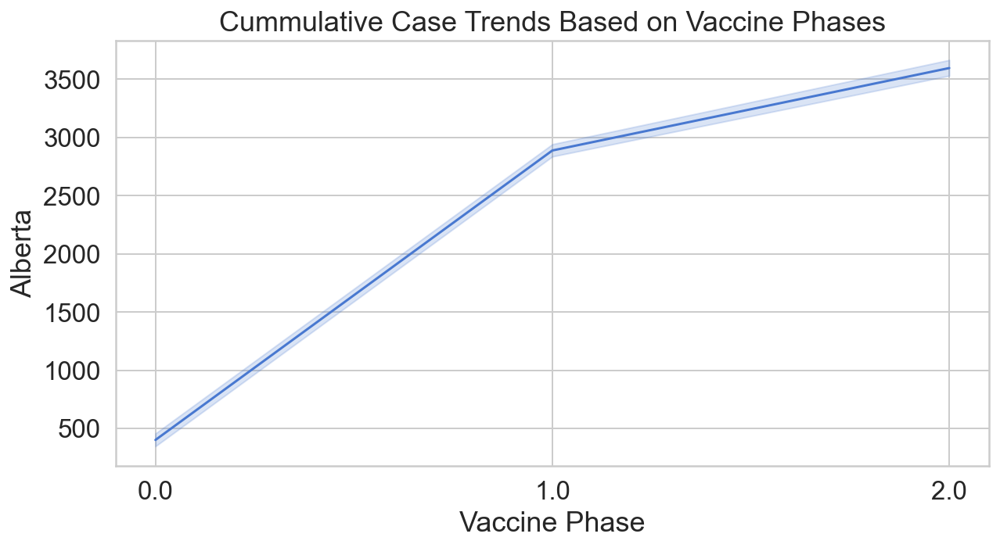

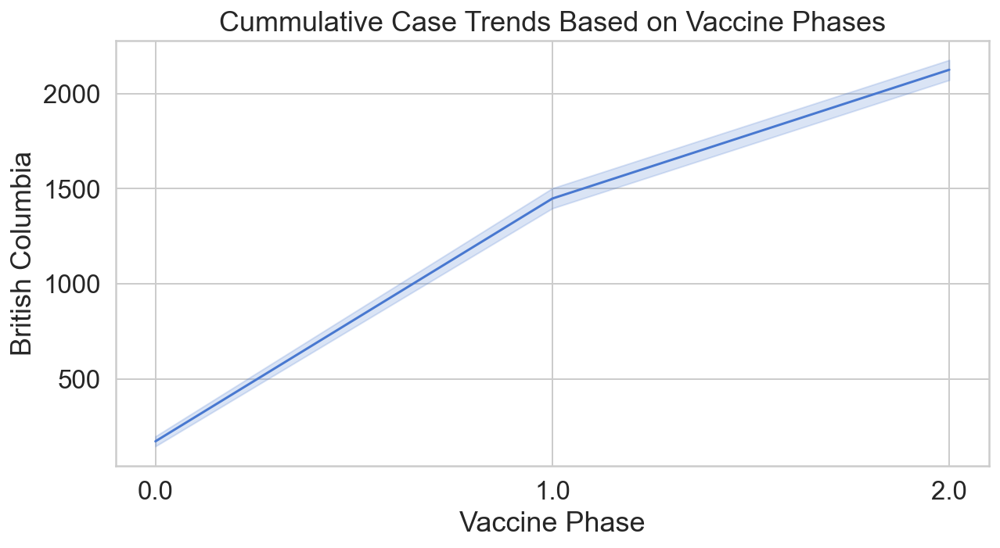

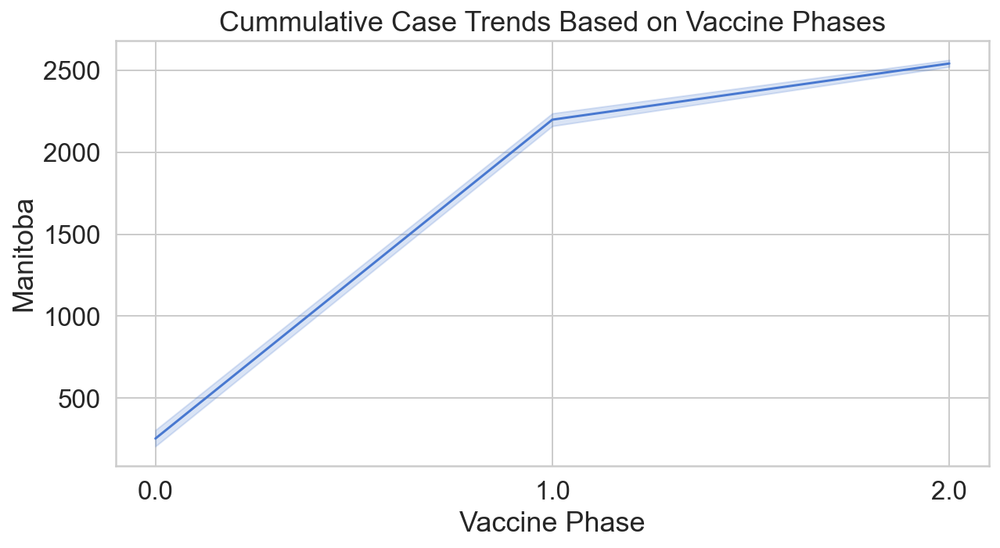

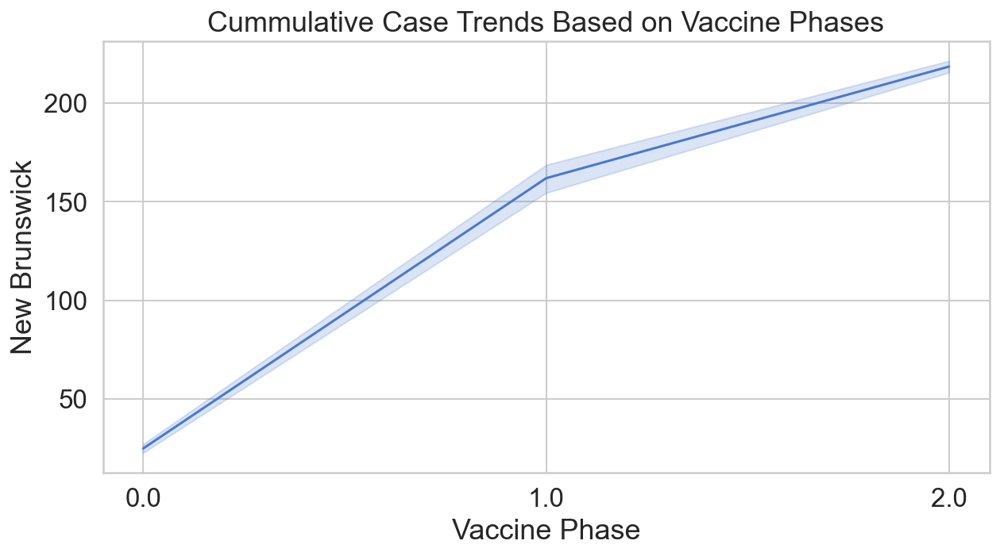

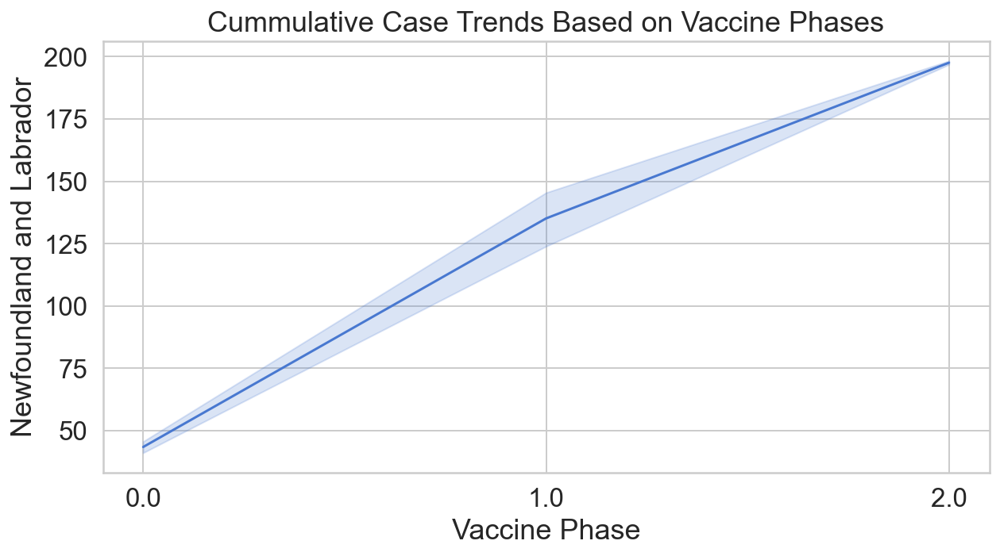

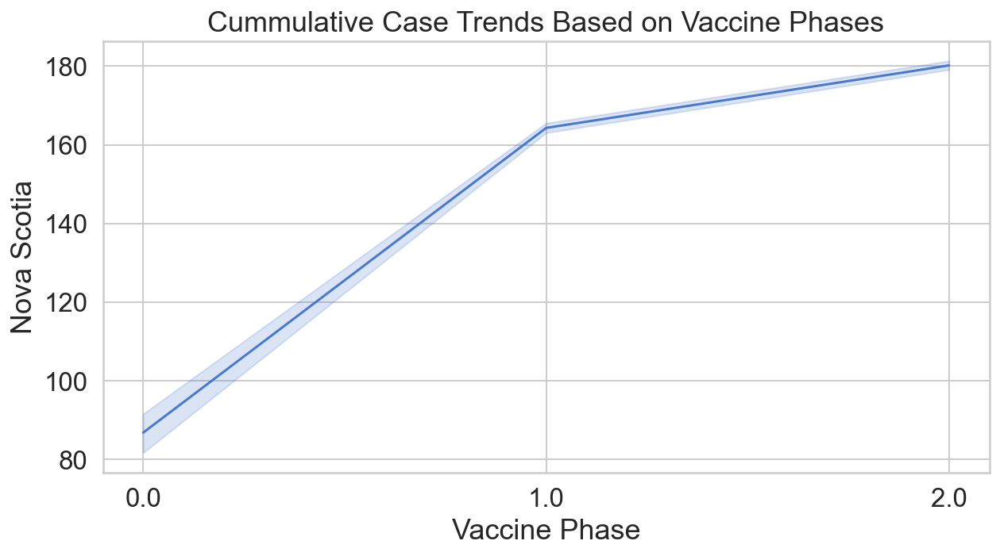

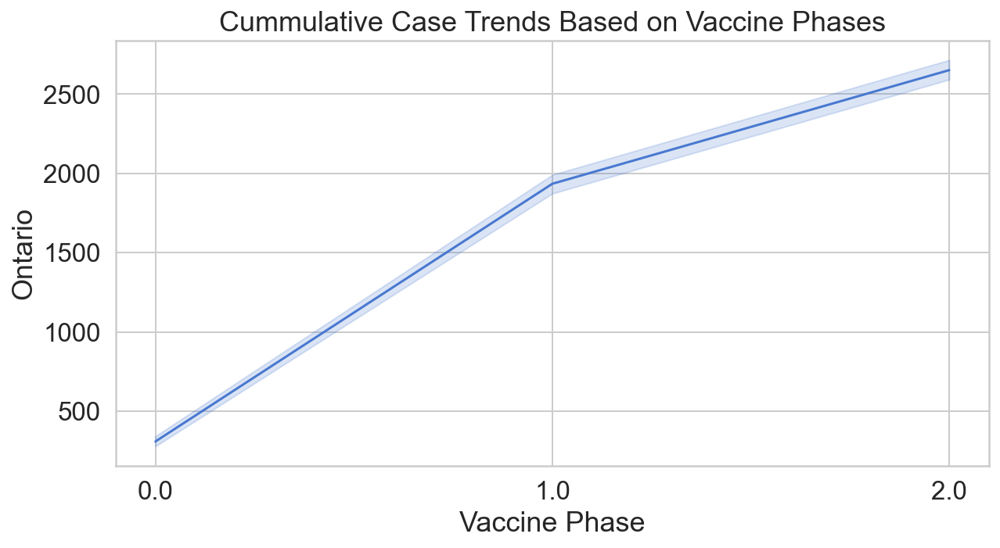

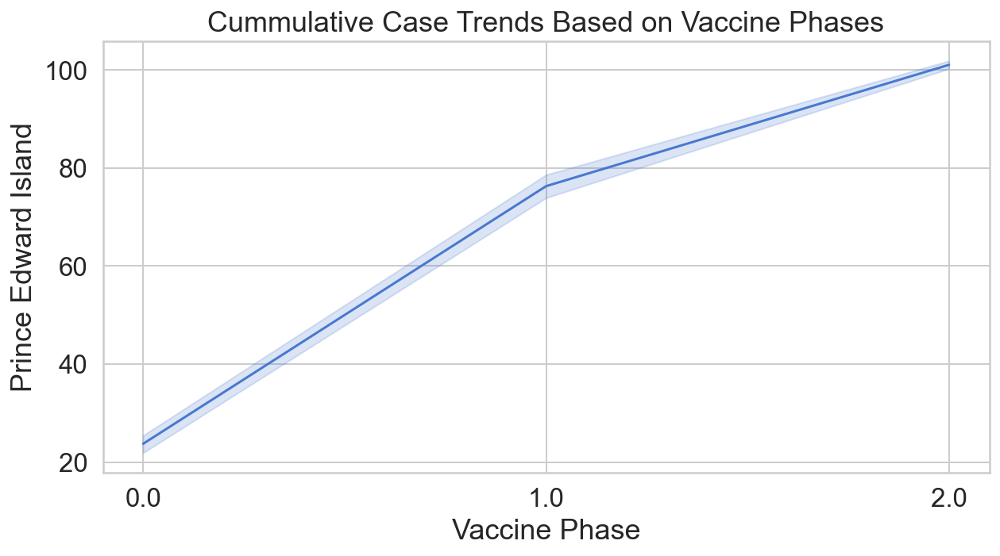

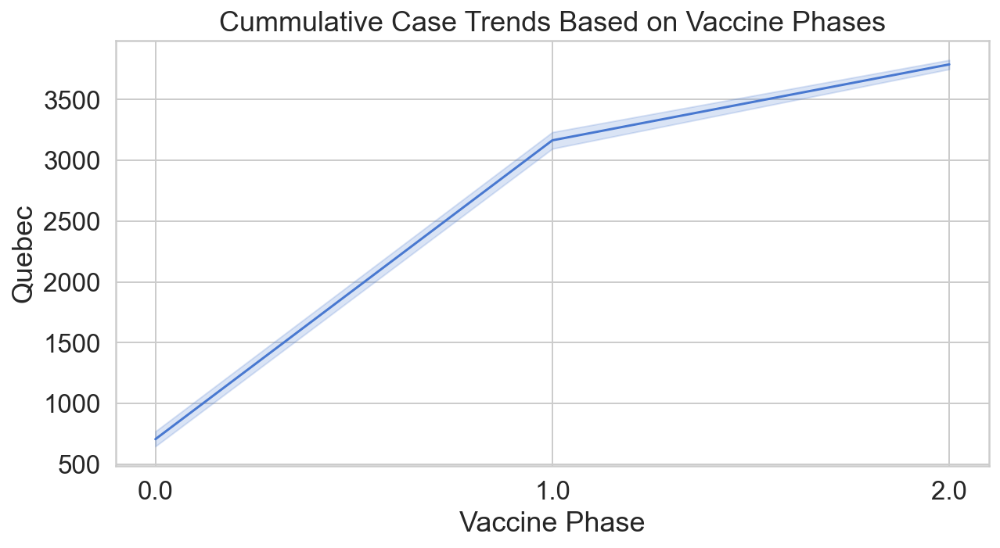

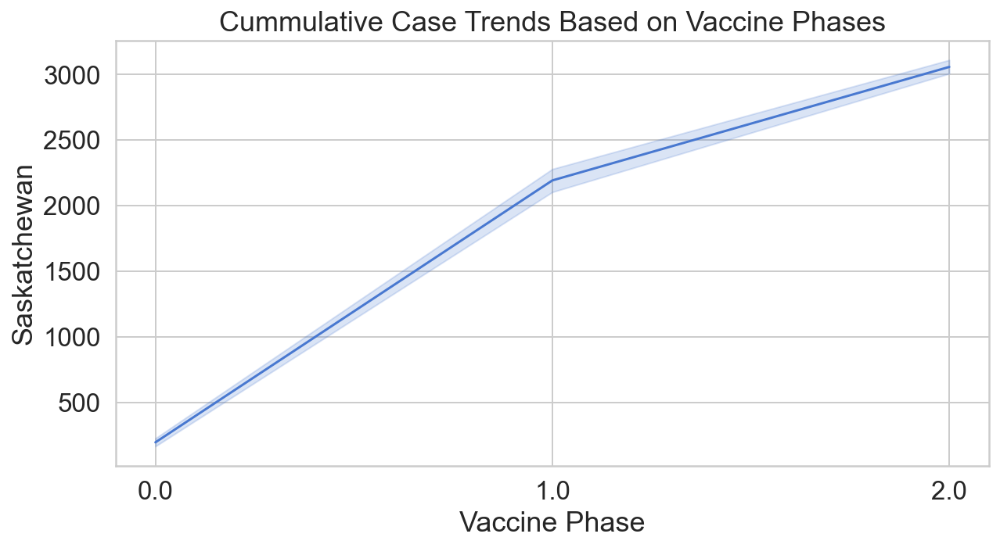

In [176]:
#How vaccine phases have affected case numbers over time
province_list = ['Alberta', 'British Columbia', 'Manitoba','New Brunswick','Newfoundland and Labrador','Nova Scotia',
                 'Ontario','Prince Edward Island','Quebec', 'Saskatchewan']
for province in province_list:
    sns.lineplot(x="Vaccine Phase", y = province, data = normalized_cases).set_title('Cummulative Case Trends Based on Vaccine Phases')
    plt.show()

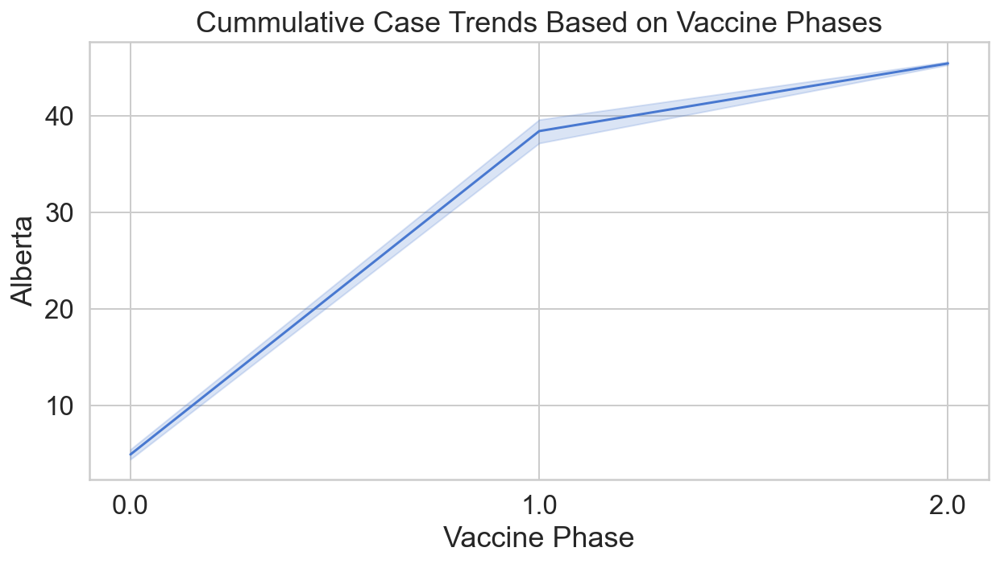

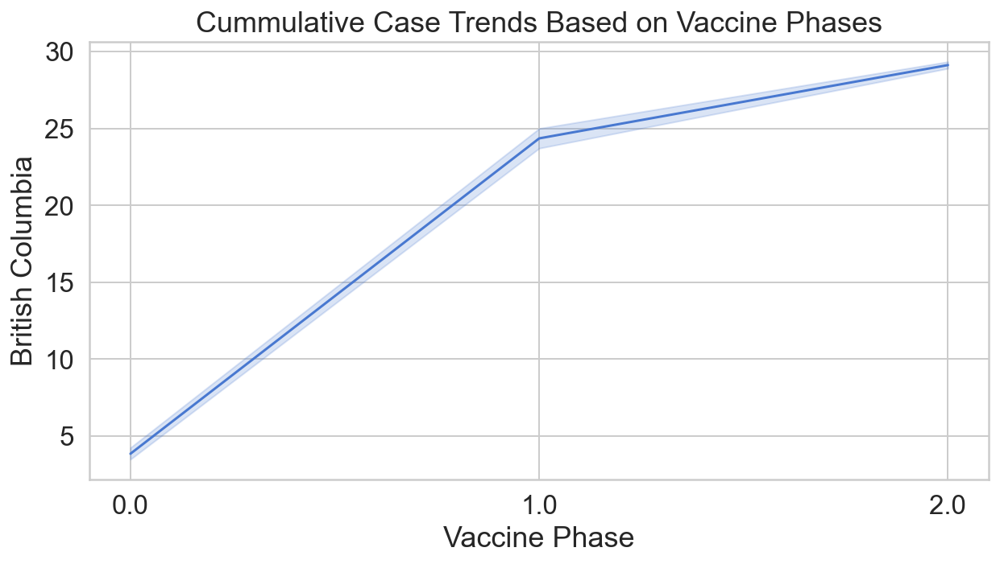

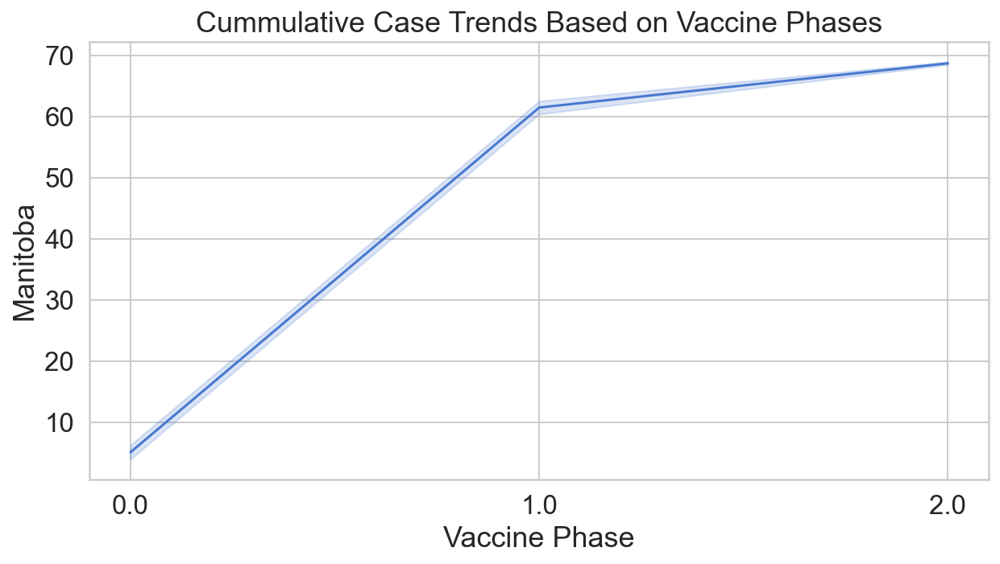

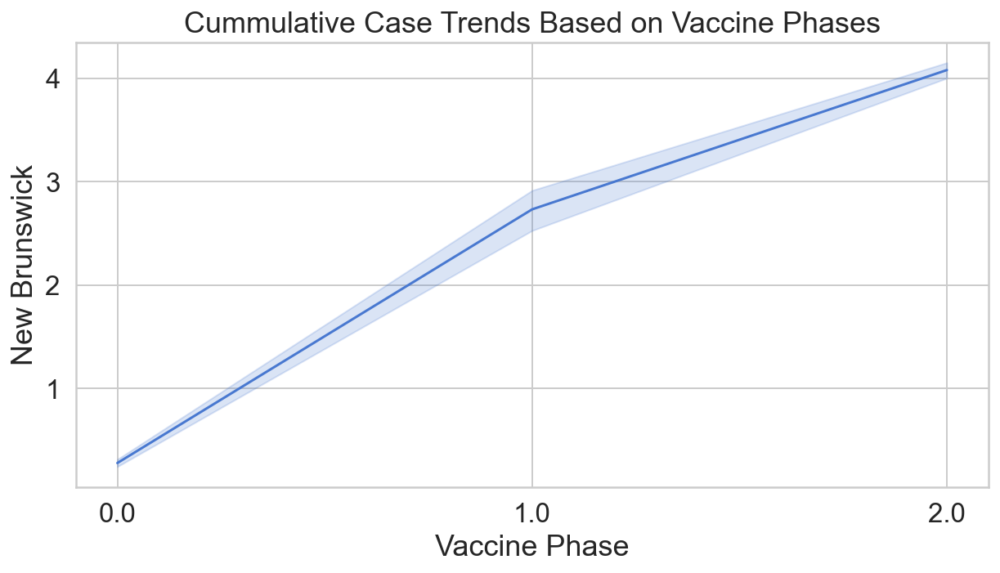

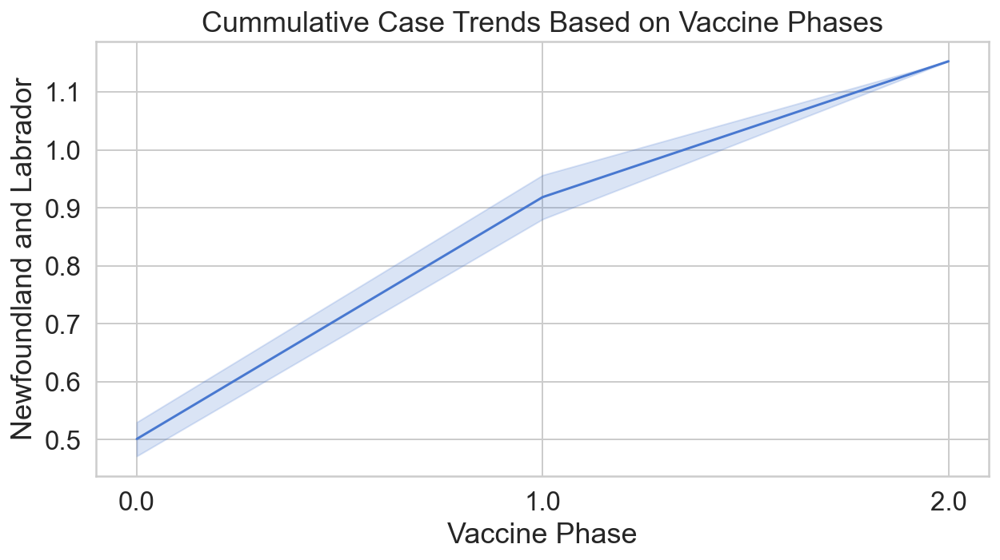

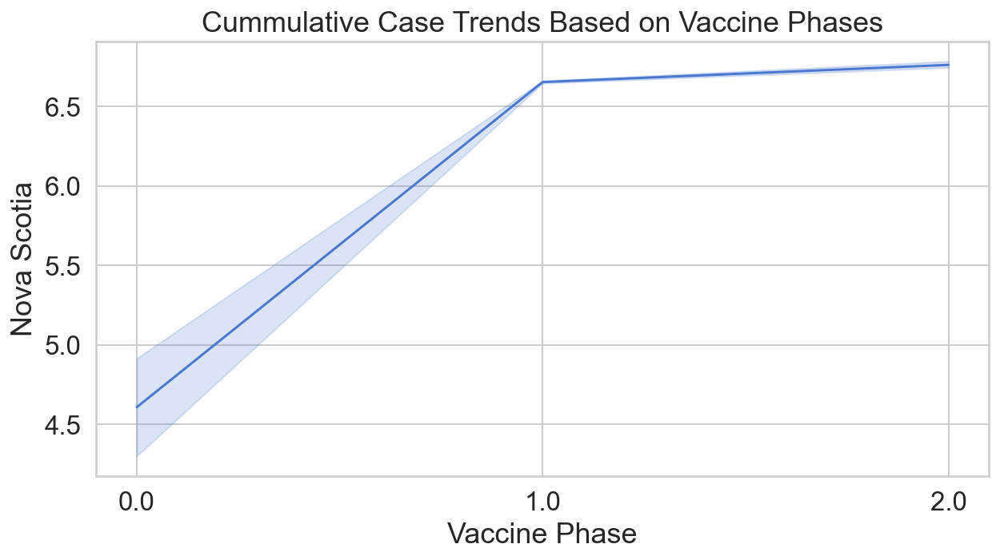

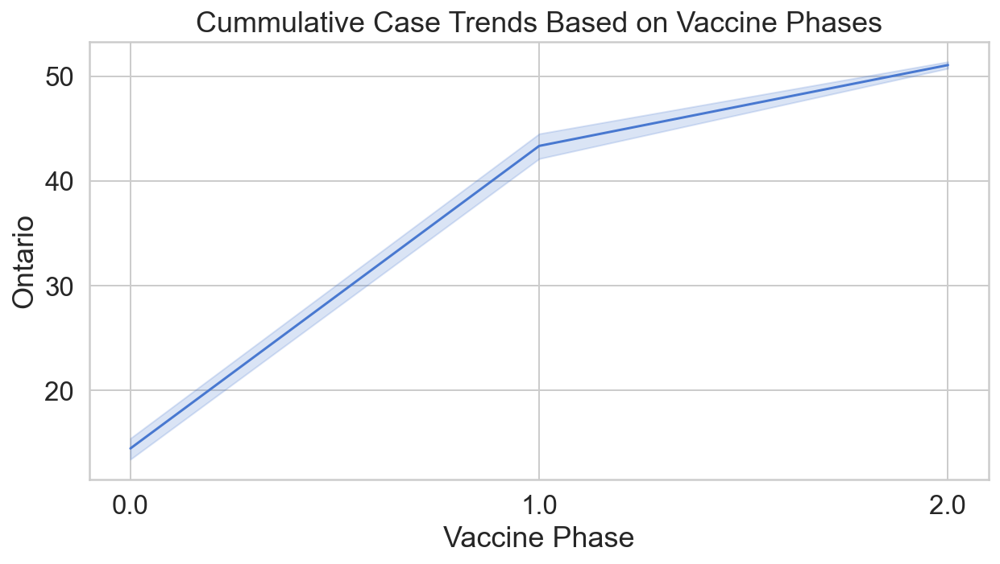

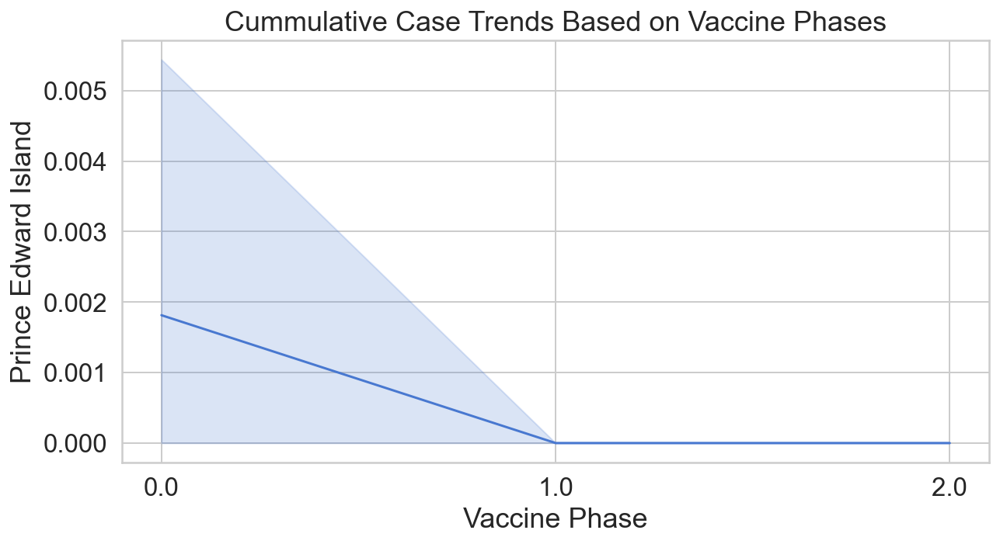

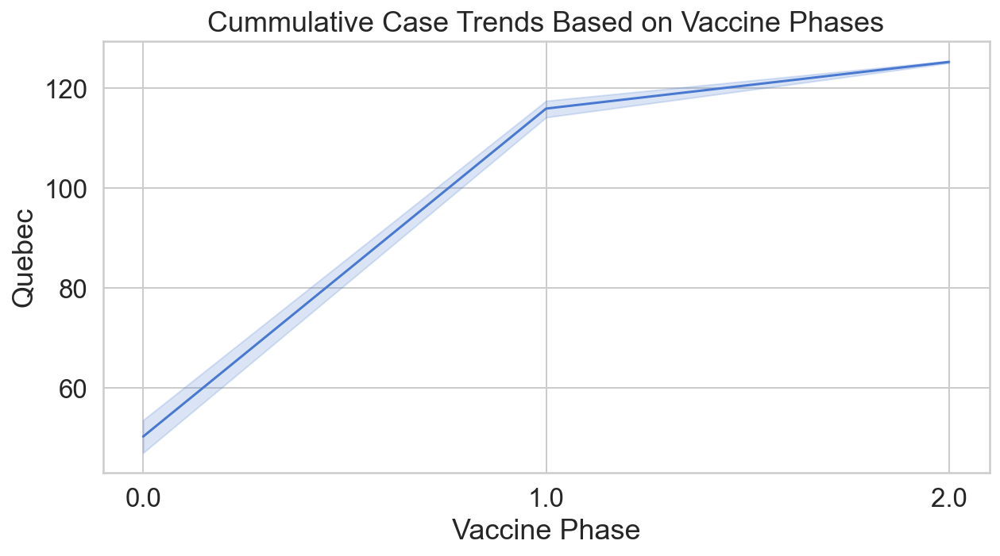

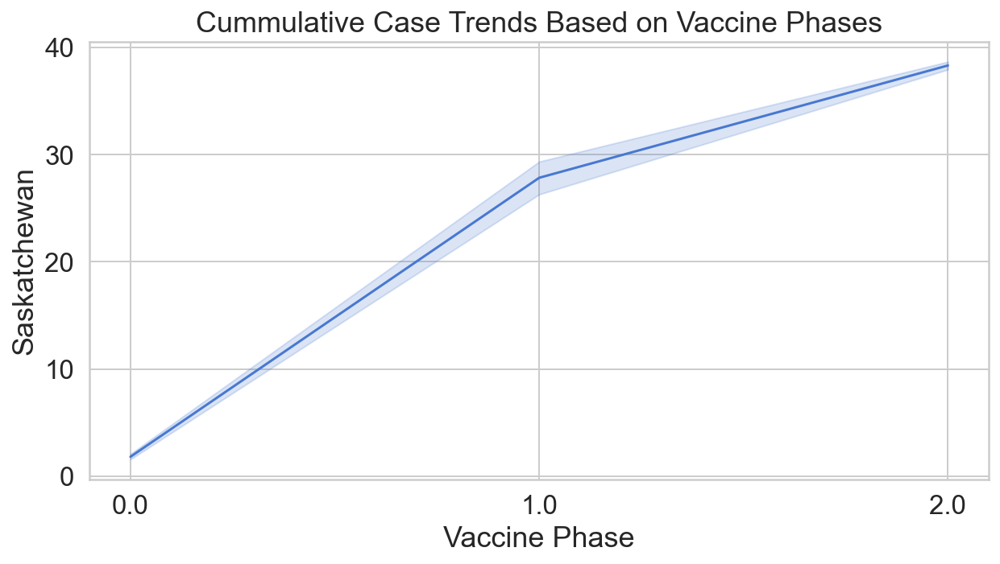

In [178]:
#How vaccine phases have affected case numbers over time
province_list = ['Alberta', 'British Columbia', 'Manitoba','New Brunswick','Newfoundland and Labrador','Nova Scotia',
                 'Ontario','Prince Edward Island','Quebec', 'Saskatchewan']
for province in province_list:
    sns.lineplot(x="Vaccine Phase", y = province, data = normalized_deaths).set_title('Cummulative Case Trends Based on Vaccine Phases')
    plt.show()

## Results

From the plots above, for all provinces we see the slope of the line decreasing after the intial roll out of the vaccine across Canadian (Phase 1), this may imply that the overall rate of Covid cases has deacreased due to availability of several Covid-19 Vaccines. This decrease in incidence can be contributed by many factors that occur when modeling infectious disease cases. These factors include weather patterns, infection control measure such as lockdowns, and number of susceptiable individuals decreases due to rocover or death from Covid 19.

### Limitations

The vaccine rollout was generalized across provinces and may not reflect actually vaccine stages. With SIR models, there are many factors that influence incidence rates in populations. This only looked at one potential variabel.

## Global Snap Shot Across the Globe of Cases in Early Stages of the Pandemic

In [166]:
df1 = covid_raw_cases.drop(["Province/State", "Lat", "Long"], axis=1)
df1 = pd.melt(df1, id_vars="Country/Region")

In [170]:
df1.loc[df1.index[0:345], 'Vaccine Phase'] = "0"
df1.loc[df1.index[345: 436], 'Vaccine Phase'] = "1"
df1.loc[df1.index[436::], 'Vaccine Phase'] = "2"
df1.value = df1.value.astype("float")
df1['Vaccine Phase'] = df1['Vaccine Phase'].astype("str")
df1

,Country/Region,variable,value,Vaccine Phase
0,Afghanistan,1/22/20,0.0,0
1,Albania,1/22/20,0.0,0
2,Algeria,1/22/20,0.0,0
3,Andorra,1/22/20,0.0,0
4,Angola,1/22/20,0.0,0
...,...,...,...,...
124391,Vietnam,4/19/21,2791.0,2
124392,West Bank and Gaza,4/19/21,282270.0,2
124393,Yemen,4/19/21,5858.0,2
124394,Zambia,4/19/21,90942.0,2


In [174]:
fig = px.scatter(df1, x ="Country/Region", color="value", y = "value", 
                  animation_frame= "variable",
                  labels={'Deathcount':'Deaths per Capita'},
                 title= "How Do Early Cummulative Covid Case Rates Occur Over Time")
fig.show()